#**1)Sentiment Analysis- Elon Musk**

In [46]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import string # special operations on strings
import spacy # language models

from matplotlib.pyplot import imread
from matplotlib import pyplot as plt
from wordcloud import WordCloud,STOPWORDS
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')


In [7]:
from google.colab import files
uploaded=files.upload()

Saving Elon_musk.csv to Elon_musk.csv


In [60]:
elon=pd.read_csv("Elon_musk.csv",encoding='latin-1')
 # removes empty strings, because they are considered in Python as False

In [61]:
type(elon)

pandas.core.frame.DataFrame

In [62]:
elon  #['Text']

,Unnamed: 0,Text
0,1,@kunalb11 Im an alien
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,3,@joerogan @Spotify Great interview!
3,4,@gtera27 Doge is underestimated
4,5,@teslacn Congratulations Tesla China for amazi...
...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n..."
1995,1996,@PPathole Make sure to read ur terms &amp; con...
1996,1997,@TeslaGong @PPathole Samwise Gamgee
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...


In [63]:
elon.drop(['Unnamed: 0'],inplace=True,axis=1)

In [64]:
elon

,Text
0,@kunalb11 Im an alien
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated
4,@teslacn Congratulations Tesla China for amazi...
...,...
1994,"@flcnhvy True, it sounds so surreal, but the n..."
1995,@PPathole Make sure to read ur terms &amp; con...
1996,@TeslaGong @PPathole Samwise Gamgee
1997,@PPathole Altho Dumb and Dumber is <U+0001F525...


In [65]:
# Text Processing
elon=[Text.strip() for Text in elon.Text] # remove both the leading and the trailing characters
elon=[Text for Text in elon if Text] # removes empty strings, because they are considered in Python as False
elon[0:5]

['@kunalb11 I\x92m an alien',
 '@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated',
 '@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!!']

In [66]:
# Joining the list into one string/text
elon_text=' '.join(elon)
elon_text

'@kunalb11 I\x92m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it? @joerogan @Spotify Great interview! @gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!! Happy New Year of the Ox! https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation. The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It\x92s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock my account @AstroJordy <U+0001F923><U

In [67]:
# remove Twitter username handles from a given twitter text. (Removes @usernames)
from nltk.tokenize import TweetTokenizer
tkn = TweetTokenizer(strip_handles=True)
elon_tokens=tkn.tokenize(elon_text)
print(elon_tokens)

['I', '\x92', 'm', 'an', 'alien', 'Ray', 'tracing', 'on', 'Cyberpunk', 'with', 'HDR', 'is', 'next-level', '.', 'Have', 'you', 'tried', 'it', '?', 'Great', 'interview', '!', 'Doge', 'is', 'underestimated', 'Congratulations', 'Tesla', 'China', 'for', 'amazing', 'execution', 'last', 'year', '.', 'Now', 'on', 'to', 'the', 'next', 'for', 'even', 'more', '!', '!', 'Happy', 'New', 'Year', 'of', 'the', 'Ox', '!', 'https://t.co/9WFKMYu2oj', 'Frodo', 'was', 'the', 'underdoge', ',', 'All', 'thought', 'he', 'would', 'fail', ',', 'Himself', 'most', 'of', 'all', '.', 'https://t.co/zGxJFDzzrM', 'Haha', 'thanks', ':)', 'Indeed', '!', 'Tweets', 'definitely', 'do', 'not', 'represent', 'real-world', 'time', 'allocation', '.', 'The', 'most', 'entertaining', 'outcome', 'is', 'the', 'most', 'likely', 'Just', 'sent', 'some', 'Just', 'agree', 'to', 'do', 'Clubhouse', 'with', 'https://t.co/3rWE9uHSTS', 'It', '\x92', 's', 'getting', 'real', 'Bought', 'some', 'Dogecoin', 'for', 'lil', 'X', ',', 'so', 'he', 'can'

In [68]:
# Again Joining the list into one string/text
elon_tokens_text=' '.join(elon_tokens)
elon_tokens_text

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is next-level . Have you tried it ? Great interview ! Doge is underestimated Congratulations Tesla China for amazing execution last year . Now on to the next for even more ! ! Happy New Year of the Ox ! https://t.co/9WFKMYu2oj Frodo was the underdoge , All thought he would fail , Himself most of all . https://t.co/zGxJFDzzrM Haha thanks :) Indeed ! Tweets definitely do not represent real-world time allocation . The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with https://t.co/3rWE9uHSTS It \x92 s getting real Bought some Dogecoin for lil X , so he can be a toddler hodler He definitely has issues , but the sentencing seems a bit high Thanks for fixing Please unlock my account <U+0001F923> <U+0001F923> This is true power haha https://t.co/Fc9uhQSd7O Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT : NASA has selected Falcon Heavy to 

In [69]:
# Remove Punctuations 
non_punc_text =elon_tokens_text.translate(str.maketrans('','',string.punctuation))
non_punc_text

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is nextlevel  Have you tried it  Great interview  Doge is underestimated Congratulations Tesla China for amazing execution last year  Now on to the next for even more   Happy New Year of the Ox  httpstco9WFKMYu2oj Frodo was the underdoge  All thought he would fail  Himself most of all  httpstcozGxJFDzzrM Haha thanks  Indeed  Tweets definitely do not represent realworld time allocation  The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with httpstco3rWE9uHSTS It \x92 s getting real Bought some Dogecoin for lil X  so he can be a toddler hodler He definitely has issues  but the sentencing seems a bit high Thanks for fixing Please unlock my account U0001F923 U0001F923 This is true power haha httpstcoFc9uhQSd7O Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT  NASA has selected Falcon Heavy to launch the first two elements of the lunar Ga

In [70]:
#import re  [to remove punctuations]
# [re.sub(r"[^A-Za-z]","",x)]

In [71]:
#def text_clean(x):
#  x=x.strip()
#  x=re.sub(r"[^A-Za-z ]","",str(x))
#  return x

In [72]:
#elon['clean_text']=elon['Text'].apply(text_clean)

In [73]:
# remove https or url within text
import re
non_url_text=re.sub(r'http\S+', '', non_punc_text)
non_url_text

'I \x92 m an alien Ray tracing on Cyberpunk with HDR is nextlevel  Have you tried it  Great interview  Doge is underestimated Congratulations Tesla China for amazing execution last year  Now on to the next for even more   Happy New Year of the Ox   Frodo was the underdoge  All thought he would fail  Himself most of all   Haha thanks  Indeed  Tweets definitely do not represent realworld time allocation  The most entertaining outcome is the most likely Just sent some Just agree to do Clubhouse with  It \x92 s getting real Bought some Dogecoin for lil X  so he can be a toddler hodler He definitely has issues  but the sentencing seems a bit high Thanks for fixing Please unlock my account U0001F923 U0001F923 This is true power haha  Any crypto wallet that won \x92 t give you your private keys should be avoided at all costs Your app sucks RT  NASA has selected Falcon Heavy to launch the first two elements of the lunar Gateway together on one mission   Yes Once we can predict cash flow reason

In [74]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [75]:
from nltk.tokenize import word_tokenize
text_tokens=word_tokenize(non_url_text)
print(text_tokens)

['I', '\x92', 'm', 'an', 'alien', 'Ray', 'tracing', 'on', 'Cyberpunk', 'with', 'HDR', 'is', 'nextlevel', 'Have', 'you', 'tried', 'it', 'Great', 'interview', 'Doge', 'is', 'underestimated', 'Congratulations', 'Tesla', 'China', 'for', 'amazing', 'execution', 'last', 'year', 'Now', 'on', 'to', 'the', 'next', 'for', 'even', 'more', 'Happy', 'New', 'Year', 'of', 'the', 'Ox', 'Frodo', 'was', 'the', 'underdoge', 'All', 'thought', 'he', 'would', 'fail', 'Himself', 'most', 'of', 'all', 'Haha', 'thanks', 'Indeed', 'Tweets', 'definitely', 'do', 'not', 'represent', 'realworld', 'time', 'allocation', 'The', 'most', 'entertaining', 'outcome', 'is', 'the', 'most', 'likely', 'Just', 'sent', 'some', 'Just', 'agree', 'to', 'do', 'Clubhouse', 'with', 'It', '\x92', 's', 'getting', 'real', 'Bought', 'some', 'Dogecoin', 'for', 'lil', 'X', 'so', 'he', 'can', 'be', 'a', 'toddler', 'hodler', 'He', 'definitely', 'has', 'issues', 'but', 'the', 'sentencing', 'seems', 'a', 'bit', 'high', 'Thanks', 'for', 'fixing',

In [76]:
# Tokens count
len(text_tokens)

17847

In [77]:
# Remove Stopwords
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')

sw_list = ['\x92','rt','ye','yeah','haha','Yes','U0001F923','I','the','an','is']
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['alien', 'Ray', 'tracing', 'Cyberpunk', 'HDR', 'nextlevel', 'Have', 'tried', 'Great', 'interview', 'Doge', 'underestimated', 'Congratulations', 'Tesla', 'China', 'amazing', 'execution', 'last', 'year', 'Now', 'next', 'even', 'Happy', 'New', 'Year', 'Ox', 'Frodo', 'underdoge', 'All', 'thought', 'would', 'fail', 'Himself', 'Haha', 'thanks', 'Indeed', 'Tweets', 'definitely', 'represent', 'realworld', 'time', 'allocation', 'The', 'entertaining', 'outcome', 'likely', 'Just', 'sent', 'Just', 'agree', 'Clubhouse', 'It', 'getting', 'real', 'Bought', 'Dogecoin', 'lil', 'X', 'toddler', 'hodler', 'He', 'definitely', 'issues', 'sentencing', 'seems', 'bit', 'high', 'Thanks', 'fixing', 'Please', 'unlock', 'account', 'This', 'true', 'power', 'Any', 'crypto', 'wallet', 'give', 'private', 'keys', 'avoided', 'costs', 'Your', 'app', 'sucks', 'RT', 'NASA', 'selected', 'Falcon', 'Heavy', 'launch', 'first', 'two', 'elements', 'lunar', 'Gateway', 'together', 'one', 'mission', 'Once', 'predict', 'cash', 'flo

In [78]:
# Normalize the data
lower_words=[Text.lower() for Text in no_stop_tokens]
print(lower_words[100:200])

['once', 'predict', 'cash', 'flow', 'reasonably', 'well', 'starlink', 'ipo', 'starlink', 'staggeringly', 'difficult', 'technical', 'economic', 'endeavor', 'however', 'spacex', 'needs', 'pass', 'deep', 'chasm', 'negative', 'cash', 'flow', 'next', 'year', 'lowest', 'cost', 'per', 'ton', 'carbon', 'sequestered', 'net', 'value', 'product', 'made', 'must', 'scalable', 'g', 'it', 'meant', 'price', 'countries', 'only', 'difference', 'taxes', 'shipping', 'this', 'intended', 'earth', 'may', 'ideas', 'apply', 'mars', 'xprize', 'team', 'manage', '100m', 'carbon', 'capture', 'prize', 'everyone', 'tesla', 'receives', 'stock', 'my', 'comp', 'stock', 'options', 'take', 'table', 'that', 'missing', 'back', 'work', 'go', 'does', 'seem', 'bit', 'high', 'doge', 'appears', 'inflationary', 'meaningfully', 'fixed', 'coins', 'per', 'unit', 'time', 'whereas', 'wow', '1', 'orbital', 'launch', 'tower', 'stack', '2', 'enough', 'raptors', 'orbit', 'booster']


In [79]:
# Stemming (If Required)
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens[100:200])

['onc', 'predict', 'cash', 'flow', 'reason', 'well', 'starlink', 'ipo', 'starlink', 'staggeringli', 'difficult', 'technic', 'econom', 'endeavor', 'howev', 'spacex', 'need', 'pass', 'deep', 'chasm', 'neg', 'cash', 'flow', 'next', 'year', 'lowest', 'cost', 'per', 'ton', 'carbon', 'sequest', 'net', 'valu', 'product', 'made', 'must', 'scalabl', 'g', 'it', 'meant', 'price', 'countri', 'onli', 'differ', 'tax', 'ship', 'thi', 'intend', 'earth', 'may', 'idea', 'appli', 'mar', 'xprize', 'team', 'manag', '100m', 'carbon', 'captur', 'prize', 'everyon', 'tesla', 'receiv', 'stock', 'my', 'comp', 'stock', 'option', 'take', 'tabl', 'that', 'miss', 'back', 'work', 'go', 'doe', 'seem', 'bit', 'high', 'doge', 'appear', 'inflationari', 'meaning', 'fix', 'coin', 'per', 'unit', 'time', 'wherea', 'wow', '1', 'orbit', 'launch', 'tower', 'stack', '2', 'enough', 'raptor', 'orbit', 'booster']


In [80]:
# Lemmatization
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

alien ray tracing cyberpunk hdr nextlevel have tried great interview doge underestimated congratulations tesla china amazing execution last year now next even happy new year ox frodo underdoge all thought would fail himself haha thanks indeed tweets definitely represent realworld time allocation the entertaining outcome likely just sent just agree clubhouse it getting real bought dogecoin lil x toddler hodler he definitely issues sentencing seems bit high thanks fixing please unlock account this true power any crypto wallet give private keys avoided costs your app sucks rt nasa selected falcon heavy launch first two elements lunar gateway together one mission once predict cash flow reasonably well starlink ipo starlink staggeringly difficult technical economic endeavor however spacex needs pass deep chasm negative cash flow next year lowest cost per ton carbon sequestered net value product made must scalable g it meant price countries only difference taxes shipping this intended earth 

In [81]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['alien', 'ray', 'trace', 'cyberpunk', 'hdr', 'nextlevel', 'have', 'try', 'great', 'interview', 'doge', 'underestimate', 'congratulation', 'tesla', 'china', 'amazing', 'execution', 'last', 'year', 'now', 'next', 'even', 'happy', 'new', 'year', 'ox', 'frodo', 'underdoge', 'all', 'think', 'would', 'fail', 'himself', 'haha', 'thank', 'indeed', 'tweet', 'definitely', 'represent', 'realworld', 'time', 'allocation', 'the', 'entertaining', 'outcome', 'likely', 'just', 'send', 'just', 'agree', 'clubhouse', 'it', 'get', 'real', 'buy', 'dogecoin', 'lil', 'x', 'toddler', 'hodler', 'he', 'definitely', 'issue', 'sentencing', 'seem', 'bit', 'high', 'thank', 'fix', 'please', 'unlock', 'account', 'this', 'true', 'power', 'any', 'crypto', 'wallet', 'give', 'private', 'key', 'avoid', 'cost', 'your', 'app', 'suck', 'rt', 'nasa', 'select', 'falcon', 'heavy', 'launch', 'first', 'two', 'element', 'lunar', 'gateway', 'together', 'one', 'mission', 'once', 'predict', 'cash', 'flow', 'reasonably', 'well', 'star

In [82]:
clean_text=' '.join(lemmas)
clean_text

'alien ray trace cyberpunk hdr nextlevel have try great interview doge underestimate congratulation tesla china amazing execution last year now next even happy new year ox frodo underdoge all think would fail himself haha thank indeed tweet definitely represent realworld time allocation the entertaining outcome likely just send just agree clubhouse it get real buy dogecoin lil x toddler hodler he definitely issue sentencing seem bit high thank fix please unlock account this true power any crypto wallet give private key avoid cost your app suck rt nasa select falcon heavy launch first two element lunar gateway together one mission once predict cash flow reasonably well starlink ipo starlink staggeringly difficult technical economic endeavor however spacex need pass deep chasm negative cash flow next year low cost per ton carbon sequester net value product make must scalable g it mean price country only difference taxis ship this intend earth may idea apply mars xprize team manage 100 m 

feature extraction

In [83]:
# 1. CountVectorizer
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
tweetscv=cv.fit_transform(lemmas)

In [84]:
print(cv.vocabulary_)

{'alien': 195, 'ray': 2359, 'trace': 3023, 'cyberpunk': 769, 'hdr': 1364, 'nextlevel': 1969, 'have': 1359, 'try': 3055, 'great': 1312, 'interview': 1561, 'doge': 894, 'underestimate': 3188, 'congratulation': 677, 'tesla': 2931, 'china': 587, 'amazing': 219, 'execution': 1063, 'last': 1645, 'year': 3405, 'now': 1997, 'next': 1968, 'even': 1037, 'happy': 1346, 'new': 1966, 'ox': 2098, 'frodo': 1213, 'underdoge': 3187, 'all': 198, 'think': 2959, 'would': 3391, 'fail': 1098, 'himself': 1406, 'haha': 1335, 'thank': 2941, 'indeed': 1502, 'tweet': 3070, 'definitely': 807, 'represent': 2426, 'realworld': 2374, 'time': 2982, 'allocation': 200, 'the': 2945, 'entertaining': 1007, 'outcome': 2076, 'likely': 1699, 'just': 1603, 'send': 2569, 'agree': 179, 'clubhouse': 616, 'it': 1580, 'get': 1272, 'real': 2369, 'buy': 505, 'dogecoin': 896, 'lil': 1700, 'toddler': 2993, 'hodler': 1412, 'he': 1365, 'issue': 1579, 'sentencing': 2574, 'seem': 2561, 'bit': 420, 'high': 1398, 'fix': 1158, 'please': 2193,

In [85]:
print(tweetscv.toarray()[100:150])

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [86]:
print(tweetscv.toarray().shape)

(11486, 3425)


In [87]:
# 2. CountVectorizer with N-grams (Bigrams & Trigrams)
cv_ngram_range = CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram = cv_ngram_range.fit_transform(lemmas)

In [88]:
print(bow_matrix_ngram.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [89]:
# 3. TF-IDF Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)

In [90]:
print(tfidf_matix_ngram.toarray())

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


word cloud

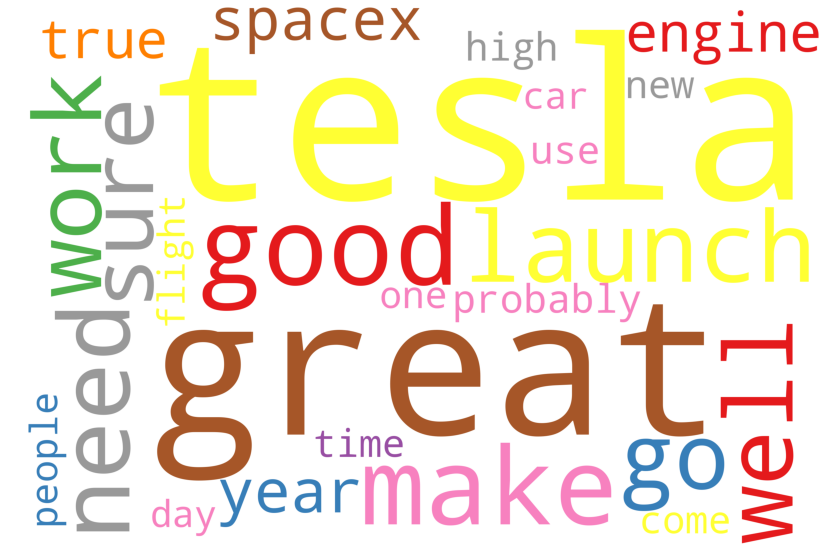

In [91]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(15,10))
    plt.imshow(wordcloud)
    plt.axis('off')
    
# Generate Word Cloud

STOPWORDS.add('pron')
STOPWORDS.add('rt')
STOPWORDS.add('yeah')
wordcloud=WordCloud(width=3000,height=2000,background_color='white',max_words=25,
                   colormap='Set1',stopwords=STOPWORDS).generate(clean_text)
plot_cloud(wordcloud)

In [92]:
##Part Of Speech Tagging
# nlp = spacy.load('en')
nlp = spacy.load('en_core_web_sm')

one_block = clean_text
doc_block = nlp(one_block)
spacy.displacy.render(doc_block, style='ent', jupyter=True)

In [93]:
one_block


'alien ray trace cyberpunk hdr nextlevel have try great interview doge underestimate congratulation tesla china amazing execution last year now next even happy new year ox frodo underdoge all think would fail himself haha thank indeed tweet definitely represent realworld time allocation the entertaining outcome likely just send just agree clubhouse it get real buy dogecoin lil x toddler hodler he definitely issue sentencing seem bit high thank fix please unlock account this true power any crypto wallet give private key avoid cost your app suck rt nasa select falcon heavy launch first two element lunar gateway together one mission once predict cash flow reasonably well starlink ipo starlink staggeringly difficult technical economic endeavor however spacex need pass deep chasm negative cash flow next year low cost per ton carbon sequester net value product make must scalable g it mean price country only difference taxis ship this intend earth may idea apply mars xprize team manage 100 m 

In [94]:
for token in doc_block[100:150]:
    print(token, token.pos_)

once ADV
predict VERB
cash NOUN
flow NOUN
reasonably ADV
well ADV
starlink VERB
ipo NOUN
starlink NOUN
staggeringly ADV
difficult ADJ
technical ADJ
economic ADJ
endeavor NOUN
however ADV
spacex ADJ
need AUX
pass VERB
deep ADJ
chasm NOUN
negative ADJ
cash NOUN
flow NOUN
next ADJ
year NOUN
low ADJ
cost NOUN
per ADP
ton NOUN
carbon NOUN
sequester NOUN
net ADJ
value NOUN
product NOUN
make VERB
must AUX
scalable VERB
g NOUN
it PRON
mean VERB
price NOUN
country NOUN
only ADV
difference NOUN
taxis ADJ
ship NOUN
this PRON
intend VERB
earth NOUN
may AUX


In [95]:
#Filtering for nouns and verbs only
nouns_verbs = [token.text for token in doc_block if token.pos_ in ('NOUN', 'VERB')]
print(nouns_verbs[100:150])

['booster', 'improve', 'ship', 'booster', 'mass', 'work', 'tonight', 'ðogecoin', 'video', 'people', 'speak', 'image', 'reflect', 'time', 'cost', 'people', 'rain', 'pain', 'u0001f3b6', 'let', 'come', 'crypto', 'simplicity', 'genius', 'decade', 'work', 'look', 'note', 'email', 'text', 'lesson', 'learn', 'earth', 'time', 'tell', 'story', 'tesla', 'read', 'kingdom', 'hear', 'name', 'year', 'dogecake', 'thing', 'restaurant', 'hang', 'currency', 'earth', 'scratch', 'destiny']


In [96]:
#Counting the noun & verb tokens
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

X = cv.fit_transform(nouns_verbs)
sum_words = X.sum(axis=0)

words_freq = [(word, sum_words[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)

wf_df = pd.DataFrame(words_freq)
wf_df.columns = ['word', 'count']


wf_df[0:10] # viewing top ten results

,word,count
0,launch,64
1,make,64
2,year,49
3,work,48
4,go,47
5,need,42
6,come,39
7,get,38
8,day,38
9,time,37


<AxesSubplot:title={'center':'Top 15 verbs and nouns'}, xlabel='word'>

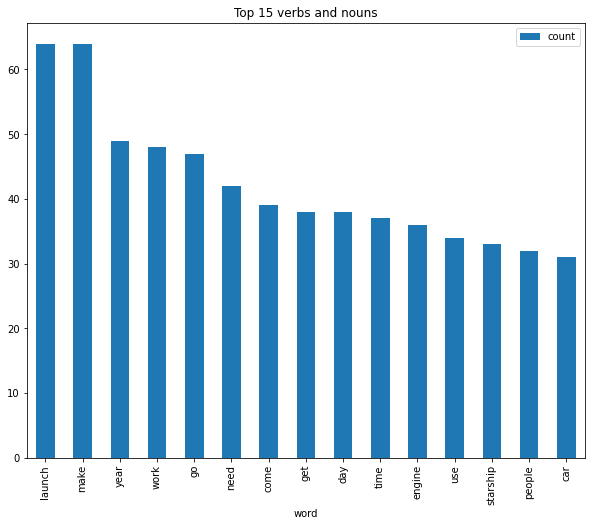

In [97]:
##Visualizing results
#Barchart for top 15 nouns + verbs
wf_df[0:15].plot.bar(x='word', figsize=(10,8), title='Top 15 verbs and nouns')

emotion mining-sentimental analysis

In [103]:
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(elon))
sentences
#nltk.download('punkt')

['@kunalb11 I\x92m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level.',
 'Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year.',
 'Now on to the next for even more!!',
 'Happy New Year of the Ox!',
 'https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all.',
 'https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed!',
 'Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It\x92s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock 

In [104]:
sentiment = pd.DataFrame(sentences,columns=['sentence'])
sentiment

,sentence
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...
1,Have you tried it?
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated @teslacn Congr...
4,Now on to the next for even more!!
...,...
919,"@kenyanwalstreet Not actually a payout, just a..."
920,"It may never pay out, as the stock cant b ht..."
921,Details Aug 28.
922,AI symbiosis while u wait @vistacruiser7 @flcn...


In [105]:
#import re  [to remove punctuations]
def text_clean(x):
  x=x.strip()
  x=re.sub(r"[^A-Za-z ]","",str(x))
  return x


sentiment['clean_sent']=sentiment['sentence'].apply(text_clean)

In [106]:
sentiment

,sentence,clean_sent
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...,kunalb Im an alien IDAACarmack Ray tracing on ...
1,Have you tried it?,Have you tried it
2,@joerogan @Spotify Great interview!,joerogan Spotify Great interview
3,@gtera27 Doge is underestimated @teslacn Congr...,gtera Doge is underestimated teslacn Congratul...
4,Now on to the next for even more!!,Now on to the next for even more
...,...,...
919,"@kenyanwalstreet Not actually a payout, just a...",kenyanwalstreet Not actually a payout just a v...
920,"It may never pay out, as the stock cant b ht...",It may never pay out as the stock cant b https...
921,Details Aug 28.,Details Aug
922,AI symbiosis while u wait @vistacruiser7 @flcn...,AI symbiosis while u wait vistacruiser flcnhvy...


In [107]:
# Emotion Lexicon - Affin
from google.colab import files
uplloaded = files.upload()
afinn =pd.read_csv('Afinn.csv',sep=',',encoding='Latin-1')
afinn

Saving Afinn.csv to Afinn (1).csv


,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [108]:
affinity_scores = afinn.set_index('word')['value'].to_dict()

In [109]:
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [111]:
#Custom function :score each word in a sentence in lemmatised form, 
#but calculate the score for the whole original sentence.
nlp = spacy.load('en_core_web_sm')
sentiment_lexicon = affinity_scores

def calculate_sentiment(text: str = None):
    sent_score = 0
    if text:
        sentence = nlp(text)
        for word in sentence:
            sent_score += sentiment_lexicon.get(word.lemma_, 0)
    return sent_score

In [113]:
# # manual testing
calculate_sentiment(text = 'great')

3

In [114]:
# Calculating sentiment value for each sentence
sentiment['sentiment_value'] = sentiment['clean_sent'].apply(calculate_sentiment)
sentiment['sentiment_value']

0      0
1      0
2      3
3      3
4      0
      ..
919    0
920   -4
921    0
922   -2
923    0
Name: sentiment_value, Length: 924, dtype: int64

In [115]:
# how many words are there in a sentence?
sentiment['word_count']=sentiment['clean_sent'].str.split().apply(len)
sentiment['word_count']

0      13
1       4
2       4
3      13
4       8
       ..
919    11
920    31
921     2
922    47
923    14
Name: word_count, Length: 924, dtype: int64

In [116]:
sentiment.sort_values('sentiment_value')

,sentence,clean_sent,sentiment_value,word_count
647,Very ba https://t.co/tJsh1Exz1Q @justpaulinel...,Very ba httpstcotJshExzQ justpaulinelol Its to...,-8,60
64,"Also, the road to hell is mostly paved with ba...",Also the road to hell is mostly paved with bad...,-7,11
837,Cool Model 3 review by @iamjamiefoxx https://t...,Cool Model review by iamjamiefoxx httpstcohJD...,-7,60
920,"It may never pay out, as the stock cant b ht...",It may never pay out as the stock cant b https...,-4,31
886,This is primarily an electrical/electronic (ch...,This is primarily an electricalelectronic chip...,-4,66
...,...,...,...,...
81,@teslaownersSV This is a good one @MrBeastYT I...,teslaownersSV This is a good one MrBeastYT I w...,13,38
585,The open areas https://t.co/rabjKrtQlw @Sav...,The open areas httpstcorabjKrtQlw SavedTesla p...,14,138
719,We just havent observed the https://t.co/mez...,We just havent observed the httpstcomezrzCneWO...,15,69
36,"@ajtourville @Erdayastronaut @SpaceX Yes, but ...",ajtourville Erdayastronaut SpaceX Yes but engi...,15,225


In [117]:
# Sentiment score of the whole review
sentiment['sentiment_value'].describe()

count    924.000000
mean       1.337662
std        2.670543
min       -8.000000
25%        0.000000
50%        0.000000
75%        3.000000
max       16.000000
Name: sentiment_value, dtype: float64

In [118]:
# positive sentiment score of the whole review
sentiment[sentiment['sentiment_value']>0]

,sentence,clean_sent,sentiment_value,word_count
2,@joerogan @Spotify Great interview!,joerogan Spotify Great interview,3,4
3,@gtera27 Doge is underestimated @teslacn Congr...,gtera Doge is underestimated teslacn Congratul...,3,13
7,https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy ...,httpstcozGxJFDzzrM OwenSparks flcnhvy anonyx H...,2,9
9,The most entertaining outcome is the most like...,The most entertaining outcome is the most like...,3,109
17,Back to work I go @CapybaraSurfer @MattWallace...,Back to work I go CapybaraSurfer MattWallace D...,4,36
...,...,...,...,...
911,He was one of the very best.,He was one of the very best,3,7
913,"@Ali_Afshari In general, we need to improve ho...",AliAfshari In general we need to improve how p...,4,87
915,"@burakaydik True Wow, IHOP &amp; GitHub are cl...",burakaydik True Wow IHOP amp GitHub are close ...,7,15
917,This is both great &amp; terrifying.,This is both great amp terrifying,3,6


In [119]:
# negative sentiment score of the whole review
sentiment[sentiment['sentiment_value']<=0]

,sentence,clean_sent,sentiment_value,word_count
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...,kunalb Im an alien IDAACarmack Ray tracing on ...,0,13
1,Have you tried it?,Have you tried it,0,4
4,Now on to the next for even more!!,Now on to the next for even more,0,8
5,Happy New Year of the Ox!,Happy New Year of the Ox,0,6
6,https://t.co/9WFKMYu2oj Frodo was the underdog...,httpstcoWFKMYuoj Frodo was the underdogeAll th...,0,12
...,...,...,...,...
919,"@kenyanwalstreet Not actually a payout, just a...",kenyanwalstreet Not actually a payout just a v...,0,11
920,"It may never pay out, as the stock cant b ht...",It may never pay out as the stock cant b https...,-4,31
921,Details Aug 28.,Details Aug,0,2
922,AI symbiosis while u wait @vistacruiser7 @flcn...,AI symbiosis while u wait vistacruiser flcnhvy...,-2,47


In [120]:
sentiment['index']=range(0,len(sentiment))
sentiment

,sentence,clean_sent,sentiment_value,word_count,index
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...,kunalb Im an alien IDAACarmack Ray tracing on ...,0,13,0
1,Have you tried it?,Have you tried it,0,4,1
2,@joerogan @Spotify Great interview!,joerogan Spotify Great interview,3,4,2
3,@gtera27 Doge is underestimated @teslacn Congr...,gtera Doge is underestimated teslacn Congratul...,3,13,3
4,Now on to the next for even more!!,Now on to the next for even more,0,8,4
...,...,...,...,...,...
919,"@kenyanwalstreet Not actually a payout, just a...",kenyanwalstreet Not actually a payout just a v...,0,11,919
920,"It may never pay out, as the stock cant b ht...",It may never pay out as the stock cant b https...,-4,31,920
921,Details Aug 28.,Details Aug,0,2,921
922,AI symbiosis while u wait @vistacruiser7 @flcn...,AI symbiosis while u wait vistacruiser flcnhvy...,-2,47,922


<AxesSubplot:title={'center':'Sentence sentiment value to sentence word count'}, xlabel='word_count', ylabel='sentiment_value'>

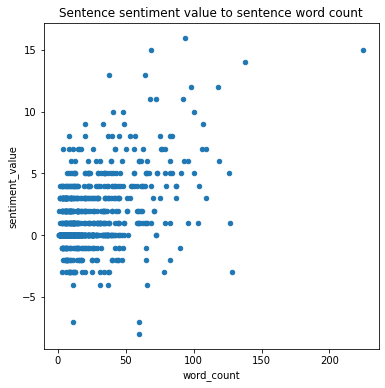

In [121]:
# Correlation analysis
sentiment.plot.scatter(x='word_count',y='sentiment_value',figsize=(6,6),title='Sentence sentiment value to sentence word count')

<AxesSubplot:xlabel='sentiment_value', ylabel='Density'>

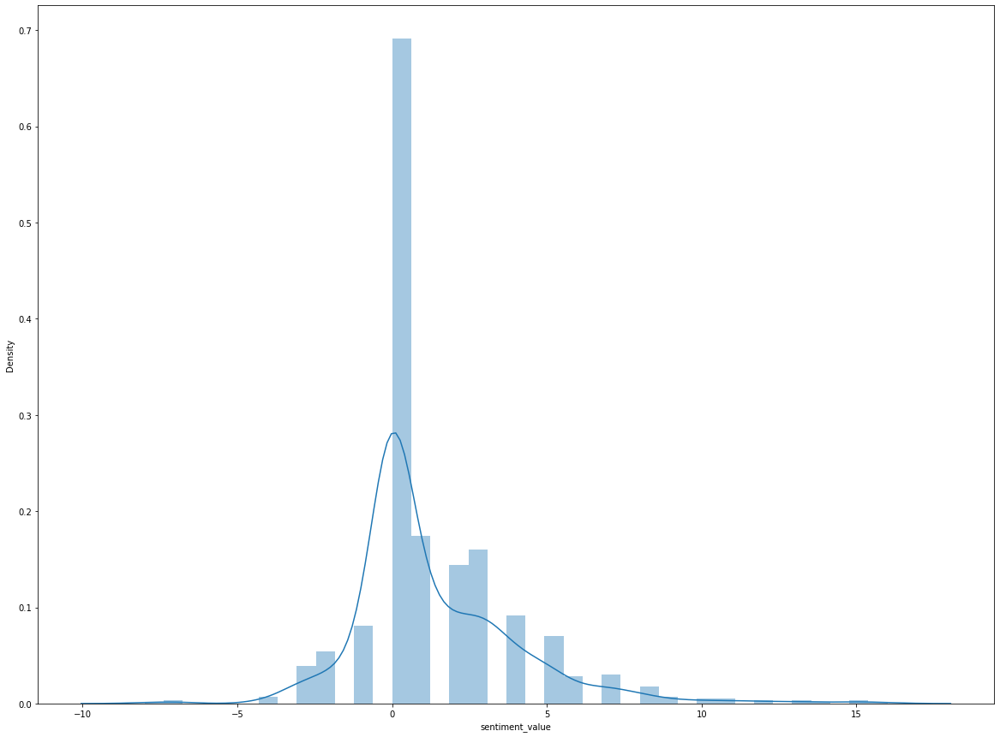

In [122]:
# Plotting the sentiment value for whole review
import seaborn as sns
plt.figure(figsize=(20,15))
sns.distplot(sentiment['sentiment_value'])

<AxesSubplot:xlabel='index', ylabel='sentiment_value'>

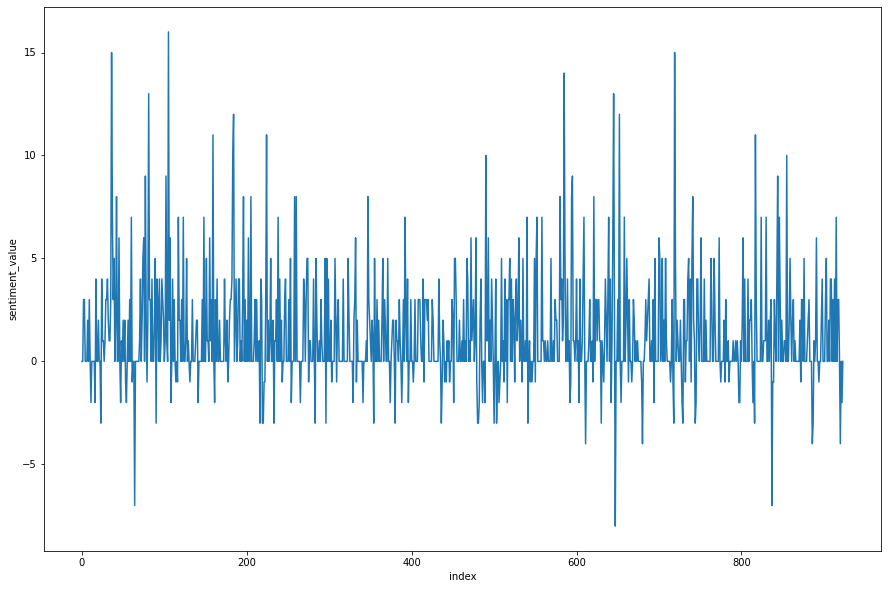

In [123]:
plt.figure(figsize=(15, 10))
sns.lineplot(y='sentiment_value',x='index',data=sentiment)

#**2) Emotion Mining**

In [ ]:
pip install scrapy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 272.9/272.9 KB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 47.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.3/57.3 KB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 81.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.4/261.4 KB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.9/93.9 KB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 KB 7.6 MB/s eta 0:00:00


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
import spacy
import warnings
warnings.filterwarnings('ignore')
from matplotlib.pyplot import imread
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

/usr/local/lib/python3.9/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [2]:
from google.colab import files
uploaded=files.upload()

Saving extract_reviews.csv to extract_reviews.csv


In [3]:
import pandas as pd
nord=pd.read_csv('extract_reviews.csv')
nord

,stars,comment
0,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n I've purchased the...
1,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n This is definitely...
2,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n I will try to keep...
3,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Performance up to ...
4,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n I bought the phone...
...,...,...
1195,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Absolutely the bes...
1196,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n I like all the fea...
1197,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n It was good expere...
1198,4.0 out of 5 stars,\n\n\n\n\n\n\n\n \n \n Good product in th...


In [4]:
# Text Processing
nord=[comment.strip() for comment in nord.comment] # remove both the leading and the trailing characters
nord=[comment for comment in nord if comment] # removes empty strings, because they are considered in Python as False
nord[0:5]

["I've purchased the 6GB version of this phone which comes with an extendable 2 GB RAM (virtual memory) capability.Good phone, but being the least expensive category offering from One-plus, there are some small evident points that will get noticed. First thing is the confusing placement of the power button (and hence the finger sensor). Daily handling of the mobile phone feels a bit annoying with fingers locking/un-locking the phone while you try to handle it and place it into Your pockets. Although this is not a big problem, it is still something to think about. The second point is about lag here and there (only to a noticeable bit), which i am hoping might go away with updates/improvements. The third point is about the speaker volume. The speaker is good only at its near maximum levels i.e the volume does not seem to creep up steadily, rather louds out only at its top volume limits. The fourth point and final one is about the camera shoots where the colors are not very realistic. Pho

In [5]:
# Joining the list into one string/text
nord_text=' '.join(nord)
nord_text

"I've purchased the 6GB version of this phone which comes with an extendable 2 GB RAM (virtual memory) capability.Good phone, but being the least expensive category offering from One-plus, there are some small evident points that will get noticed. First thing is the confusing placement of the power button (and hence the finger sensor). Daily handling of the mobile phone feels a bit annoying with fingers locking/un-locking the phone while you try to handle it and place it into Your pockets. Although this is not a big problem, it is still something to think about. The second point is about lag here and there (only to a noticeable bit), which i am hoping might go away with updates/improvements. The third point is about the speaker volume. The speaker is good only at its near maximum levels i.e the volume does not seem to creep up steadily, rather louds out only at its top volume limits. The fourth point and final one is about the camera shoots where the colors are not very realistic. Phot

In [6]:
# remove Twitter username handles from a given twitter text. (Removes @usernames)
from nltk.tokenize import TweetTokenizer
tkn = TweetTokenizer(strip_handles=True)
nord_tokens=tkn.tokenize(nord_text)
print(nord_tokens)

["I've", 'purchased', 'the', '6GB', 'version', 'of', 'this', 'phone', 'which', 'comes', 'with', 'an', 'extendable', '2', 'GB', 'RAM', '(', 'virtual', 'memory', ')', 'capability.Good', 'phone', ',', 'but', 'being', 'the', 'least', 'expensive', 'category', 'offering', 'from', 'One-plus', ',', 'there', 'are', 'some', 'small', 'evident', 'points', 'that', 'will', 'get', 'noticed', '.', 'First', 'thing', 'is', 'the', 'confusing', 'placement', 'of', 'the', 'power', 'button', '(', 'and', 'hence', 'the', 'finger', 'sensor', ')', '.', 'Daily', 'handling', 'of', 'the', 'mobile', 'phone', 'feels', 'a', 'bit', 'annoying', 'with', 'fingers', 'locking', '/', 'un-locking', 'the', 'phone', 'while', 'you', 'try', 'to', 'handle', 'it', 'and', 'place', 'it', 'into', 'Your', 'pockets', '.', 'Although', 'this', 'is', 'not', 'a', 'big', 'problem', ',', 'it', 'is', 'still', 'something', 'to', 'think', 'about', '.', 'The', 'second', 'point', 'is', 'about', 'lag', 'here', 'and', 'there', '(', 'only', 'to', 'a'

In [7]:
# Again Joining the list into one string/text
nord_tokens_text=' '.join(nord_tokens)
nord_tokens_text

"I've purchased the 6GB version of this phone which comes with an extendable 2 GB RAM ( virtual memory ) capability.Good phone , but being the least expensive category offering from One-plus , there are some small evident points that will get noticed . First thing is the confusing placement of the power button ( and hence the finger sensor ) . Daily handling of the mobile phone feels a bit annoying with fingers locking / un-locking the phone while you try to handle it and place it into Your pockets . Although this is not a big problem , it is still something to think about . The second point is about lag here and there ( only to a noticeable bit ) , which i am hoping might go away with updates / improvements . The third point is about the speaker volume . The speaker is good only at its near maximum levels i . e the volume does not seem to creep up steadily , rather louds out only at its top volume limits . The fourth point and final one is about the camera shoots where the colors are 

In [8]:
# Remove Punctuations 
non_punc_text =nord_tokens_text.translate(str.maketrans('','',string.punctuation))
non_punc_text

'Ive purchased the 6GB version of this phone which comes with an extendable 2 GB RAM  virtual memory  capabilityGood phone  but being the least expensive category offering from Oneplus  there are some small evident points that will get noticed  First thing is the confusing placement of the power button  and hence the finger sensor   Daily handling of the mobile phone feels a bit annoying with fingers locking  unlocking the phone while you try to handle it and place it into Your pockets  Although this is not a big problem  it is still something to think about  The second point is about lag here and there  only to a noticeable bit   which i am hoping might go away with updates  improvements  The third point is about the speaker volume  The speaker is good only at its near maximum levels i  e the volume does not seem to creep up steadily  rather louds out only at its top volume limits  The fourth point and final one is about the camera shoots where the colors are not very realistic  Photo

In [9]:
# remove https or url within text
import re
non_url_text=re.sub(r'http\S+', '', non_punc_text)
non_url_text

'Ive purchased the 6GB version of this phone which comes with an extendable 2 GB RAM  virtual memory  capabilityGood phone  but being the least expensive category offering from Oneplus  there are some small evident points that will get noticed  First thing is the confusing placement of the power button  and hence the finger sensor   Daily handling of the mobile phone feels a bit annoying with fingers locking  unlocking the phone while you try to handle it and place it into Your pockets  Although this is not a big problem  it is still something to think about  The second point is about lag here and there  only to a noticeable bit   which i am hoping might go away with updates  improvements  The third point is about the speaker volume  The speaker is good only at its near maximum levels i  e the volume does not seem to creep up steadily  rather louds out only at its top volume limits  The fourth point and final one is about the camera shoots where the colors are not very realistic  Photo

In [10]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [11]:
from nltk.tokenize import word_tokenize
text_tokens=word_tokenize(non_url_text)
print(text_tokens)

['Ive', 'purchased', 'the', '6GB', 'version', 'of', 'this', 'phone', 'which', 'comes', 'with', 'an', 'extendable', '2', 'GB', 'RAM', 'virtual', 'memory', 'capabilityGood', 'phone', 'but', 'being', 'the', 'least', 'expensive', 'category', 'offering', 'from', 'Oneplus', 'there', 'are', 'some', 'small', 'evident', 'points', 'that', 'will', 'get', 'noticed', 'First', 'thing', 'is', 'the', 'confusing', 'placement', 'of', 'the', 'power', 'button', 'and', 'hence', 'the', 'finger', 'sensor', 'Daily', 'handling', 'of', 'the', 'mobile', 'phone', 'feels', 'a', 'bit', 'annoying', 'with', 'fingers', 'locking', 'unlocking', 'the', 'phone', 'while', 'you', 'try', 'to', 'handle', 'it', 'and', 'place', 'it', 'into', 'Your', 'pockets', 'Although', 'this', 'is', 'not', 'a', 'big', 'problem', 'it', 'is', 'still', 'something', 'to', 'think', 'about', 'The', 'second', 'point', 'is', 'about', 'lag', 'here', 'and', 'there', 'only', 'to', 'a', 'noticeable', 'bit', 'which', 'i', 'am', 'hoping', 'might', 'go', '

In [12]:
# Tokens count
len(text_tokens)

133920

In [13]:
# Remove Stopwords
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')

sw_list = ['\x92','rt','ye','yeah','haha','Yes','U0001F923','I','the','an','is']
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['Ive', 'purchased', '6GB', 'version', 'phone', 'comes', 'extendable', '2', 'GB', 'RAM', 'virtual', 'memory', 'capabilityGood', 'phone', 'least', 'expensive', 'category', 'offering', 'Oneplus', 'small', 'evident', 'points', 'get', 'noticed', 'First', 'thing', 'confusing', 'placement', 'power', 'button', 'hence', 'finger', 'sensor', 'Daily', 'handling', 'mobile', 'phone', 'feels', 'bit', 'annoying', 'fingers', 'locking', 'unlocking', 'phone', 'try', 'handle', 'place', 'Your', 'pockets', 'Although', 'big', 'problem', 'still', 'something', 'think', 'The', 'second', 'point', 'lag', 'noticeable', 'bit', 'hoping', 'might', 'go', 'away', 'updates', 'improvements', 'The', 'third', 'point', 'speaker', 'volume', 'The', 'speaker', 'good', 'near', 'maximum', 'levels', 'e', 'volume', 'seem', 'creep', 'steadily', 'rather', 'louds', 'top', 'volume', 'limits', 'The', 'fourth', 'point', 'final', 'one', 'camera', 'shoots', 'colors', 'realistic', 'Photos', 'taken', 'day', 'light', 'especially', 'skin', '

In [14]:
# Normalize the data
lower_words=[Text.lower() for Text in no_stop_tokens]
print(lower_words[100:200])

['light', 'especially', 'skin', 'tone', 'tend', 'coloured', 'led', 'flash', 'average', 'could', 'betterthe', 'good', 'awesome', 'part', 'phone', 'practicality', 'daily', 'users', 'oneplus', 'strong', 'brand', 'part', 'pricing', 'offered', 'battery', 'life', 'good', 'recharging', 'capability', 'also', 'impressive', 'someone', 'like', 'moved', 'android', '10', 'phone', 'build', 'phone', 'apt', 'survive', 'normal', 'falls', 'mishaps', 'happening', 'the', 'phone', 'feel', 'solid', 'hand', 'stock', 'android', 'clean', 'nothing', 'complain', 'aboutoverall', 'clean', 'phone', 'small', 'improvements', 'would', 'make', 'allrounder', 'cut', 'rest', 'keeping', 'oneplus', 'branding', 'mind', 'this', 'definitely', 'budget', 'branded', 'phone', '📱', '1', 'month', '22', 'days', 'use', 'today', 'posting', 'review', 'got', 'phone', 'childrens', 'day', 'gift', '🎁', 'father', '❤', '️pros', '1', 'if', 'heavy', 'user', 'charge', 'stay', '10', '12']


In [15]:
# Stemming (If Required)
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens[100:200])

['light', 'especi', 'skin', 'tone', 'tend', 'colour', 'led', 'flash', 'averag', 'could', 'betterth', 'good', 'awesom', 'part', 'phone', 'practic', 'daili', 'user', 'oneplu', 'strong', 'brand', 'part', 'price', 'offer', 'batteri', 'life', 'good', 'recharg', 'capabl', 'also', 'impress', 'someon', 'like', 'move', 'android', '10', 'phone', 'build', 'phone', 'apt', 'surviv', 'normal', 'fall', 'mishap', 'happen', 'the', 'phone', 'feel', 'solid', 'hand', 'stock', 'android', 'clean', 'noth', 'complain', 'aboutoveral', 'clean', 'phone', 'small', 'improv', 'would', 'make', 'allround', 'cut', 'rest', 'keep', 'oneplu', 'brand', 'mind', 'thi', 'definit', 'budget', 'brand', 'phone', '📱', '1', 'month', '22', 'day', 'use', 'today', 'post', 'review', 'got', 'phone', 'children', 'day', 'gift', '🎁', 'father', '❤', '️pro', '1', 'if', 'heavi', 'user', 'charg', 'stay', '10', '12']


In [16]:
# Lemmatization
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

ive purchased 6gb version phone comes extendable 2 gb ram virtual memory capabilitygood phone least expensive category offering oneplus small evident points get noticed first thing confusing placement power button hence finger sensor daily handling mobile phone feels bit annoying fingers locking unlocking phone try handle place your pockets although big problem still something think the second point lag noticeable bit hoping might go away updates improvements the third point speaker volume the speaker good near maximum levels e volume seem creep steadily rather louds top volume limits the fourth point final one camera shoots colors realistic photos taken day light especially skin tone tend coloured led flash average could betterthe good awesome part phone practicality daily users oneplus strong brand part pricing offered battery life good recharging capability also impressive someone like moved android 10 phone build phone apt survive normal falls mishaps happening the phone feel solid

In [17]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['I', 've', 'purchase', '6', 'gb', 'version', 'phone', 'come', 'extendable', '2', 'gb', 'ram', 'virtual', 'memory', 'capabilitygood', 'phone', 'least', 'expensive', 'category', 'offer', 'oneplus', 'small', 'evident', 'point', 'get', 'notice', 'first', 'thing', 'confuse', 'placement', 'power', 'button', 'hence', 'finger', 'sensor', 'daily', 'handle', 'mobile', 'phone', 'feel', 'bit', 'annoying', 'finger', 'lock', 'unlock', 'phone', 'try', 'handle', 'place', 'your', 'pocket', 'although', 'big', 'problem', 'still', 'something', 'think', 'the', 'second', 'point', 'lag', 'noticeable', 'bit', 'hope', 'might', 'go', 'away', 'update', 'improvement', 'the', 'third', 'point', 'speaker', 'volume', 'the', 'speaker', 'good', 'near', 'maximum', 'level', 'e', 'volume', 'seem', 'creep', 'steadily', 'rather', 'loud', 'top', 'volume', 'limit', 'the', 'fourth', 'point', 'final', 'one', 'camera', 'shoot', 'color', 'realistic', 'photo', 'take', 'day', 'light', 'especially', 'skin', 'tone', 'tend', 'colour'

In [18]:
clean_comment=' '.join(lemmas)
clean_comment

"I ve purchase 6 gb version phone come extendable 2 gb ram virtual memory capabilitygood phone least expensive category offer oneplus small evident point get notice first thing confuse placement power button hence finger sensor daily handle mobile phone feel bit annoying finger lock unlock phone try handle place your pocket although big problem still something think the second point lag noticeable bit hope might go away update improvement the third point speaker volume the speaker good near maximum level e volume seem creep steadily rather loud top volume limit the fourth point final one camera shoot color realistic photo take day light especially skin tone tend colour lead flash average could betterthe good awesome part phone practicality daily user oneplus strong brand part pricing offer battery life good recharging capability also impressive someone like move android 10 phone build phone apt survive normal fall mishap happen the phone feel solid hand stock android clean nothing comp

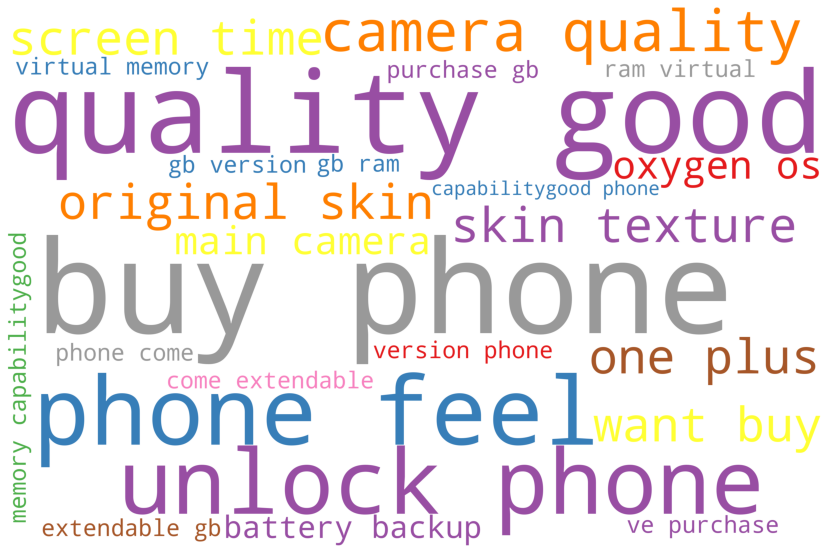

In [19]:
#word cloud

# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(15,10))
    plt.imshow(wordcloud)
    plt.axis('off')
    
# Generate Word Cloud

STOPWORDS.add('pron')
STOPWORDS.add('rt')
STOPWORDS.add('yeah')
wordcloud=WordCloud(width=3000,height=2000,background_color='white',max_words=25,
                   colormap='Set1',stopwords=STOPWORDS).generate(clean_comment)
plot_cloud(wordcloud)

In [21]:
#remove punctuations
#import re

In [22]:
#def text_clean(x):
#  x=x.strip()
#  x=re.sub(r"[^A-Za-z ]","",str(x))
#  return x

In [23]:
#nord['clean_text']=nord['comment'].apply(text_clean)

In [24]:
#pd.DataFrame(nord)

In [25]:
##Part Of Speech Tagging
# nlp = spacy.load('en')
nlp = spacy.load('en_core_web_sm')

one_block = clean_comment
doc_block = nlp(one_block)
spacy.displacy.render(doc_block, style='ent', jupyter=True)

emotion mining

In [26]:
from nltk import tokenize
sentences = tokenize.sent_tokenize(" ".join(nord))
sentences

["I've purchased the 6GB version of this phone which comes with an extendable 2 GB RAM (virtual memory) capability.Good phone, but being the least expensive category offering from One-plus, there are some small evident points that will get noticed.",
 'First thing is the confusing placement of the power button (and hence the finger sensor).',
 'Daily handling of the mobile phone feels a bit annoying with fingers locking/un-locking the phone while you try to handle it and place it into Your pockets.',
 'Although this is not a big problem, it is still something to think about.',
 'The second point is about lag here and there (only to a noticeable bit), which i am hoping might go away with updates/improvements.',
 'The third point is about the speaker volume.',
 'The speaker is good only at its near maximum levels i.e the volume does not seem to creep up steadily, rather louds out only at its top volume limits.',
 'The fourth point and final one is about the camera shoots where the colors

In [27]:
nord

["I've purchased the 6GB version of this phone which comes with an extendable 2 GB RAM (virtual memory) capability.Good phone, but being the least expensive category offering from One-plus, there are some small evident points that will get noticed. First thing is the confusing placement of the power button (and hence the finger sensor). Daily handling of the mobile phone feels a bit annoying with fingers locking/un-locking the phone while you try to handle it and place it into Your pockets. Although this is not a big problem, it is still something to think about. The second point is about lag here and there (only to a noticeable bit), which i am hoping might go away with updates/improvements. The third point is about the speaker volume. The speaker is good only at its near maximum levels i.e the volume does not seem to creep up steadily, rather louds out only at its top volume limits. The fourth point and final one is about the camera shoots where the colors are not very realistic. Pho

In [28]:
sentiment = pd.DataFrame(nord,columns=['sentence'])
sentiment

,sentence
0,I've purchased the 6GB version of this phone w...
1,This is definitely a budget branded phone 📱 af...
2,I will try to keep this review short. This rev...
3,"Performance up to the mark👍, If you do more ga..."
4,I bought the phone in Jan 2023 @ 18250. Below ...
...,...
1195,Absolutely the best smartphone with value for ...
1196,I like all the features as it is a budget phon...
1197,It was good experence to shoping with amazon.....
1198,Good product in this price..


In [29]:
#import re  [to remove punctuations]
def text_clean(x):
  x=x.strip()
  x=re.sub(r"[^A-Za-z ]","",str(x))
  return x


sentiment['clean_sent']=sentiment['sentence'].apply(text_clean)

In [30]:
sentiment

,sentence,clean_sent
0,I've purchased the 6GB version of this phone w...,Ive purchased the GB version of this phone whi...
1,This is definitely a budget branded phone 📱 af...,This is definitely a budget branded phone aft...
2,I will try to keep this review short. This rev...,I will try to keep this review short This revi...
3,"Performance up to the mark👍, If you do more ga...",Performance up to the mark If you do more gami...
4,I bought the phone in Jan 2023 @ 18250. Below ...,I bought the phone in Jan Below are pros an...
...,...,...
1195,Absolutely the best smartphone with value for ...,Absolutely the best smartphone with value for ...
1196,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...
1197,It was good experence to shoping with amazon.....,It was good experence to shoping with amazonmy...
1198,Good product in this price..,Good product in this price


In [31]:
# Emotion Lexicon - Affin
from google.colab import files
uplloaded = files.upload()
afinn =pd.read_csv('Afinn.csv',sep=',',encoding='Latin-1')
afinn

Saving Afinn.csv to Afinn.csv


,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [33]:
affinity_scores = afinn.set_index('word')['value'].to_dict()

In [34]:
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [35]:
#Custom function :score each word in a sentence in lemmatised form, 
#but calculate the score for the whole original sentence.
nlp = spacy.load('en_core_web_sm')
sentiment_lexicon = affinity_scores

def calculate_sentiment(text: str = None):
    sent_score = 0
    if text:
        sentence = nlp(text)
        for word in sentence:
            sent_score += sentiment_lexicon.get(word.lemma_, 0)
    return sent_score

In [36]:
# manual testing
calculate_sentiment(text='good')

3

In [37]:
# Calculating sentiment value for each sentence
sentiment['sentiment_value']=sentiment['sentence'].apply(calculate_sentiment)
sentiment['sentiment_value']

0       27
1       10
2        9
3        4
4       18
        ..
1195    19
1196    -1
1197    11
1198     3
1199     3
Name: sentiment_value, Length: 1200, dtype: int64

In [38]:
# how many words are there in a sentence?
sentiment['word_count']=sentiment['sentence'].str.split().apply(len)
sentiment['word_count']

0       298
1       151
2       216
3        51
4       192
       ... 
1195     84
1196     55
1197     22
1198      5
1199      2
Name: word_count, Length: 1200, dtype: int64

In [39]:
sentiment.sort_values(by='sentiment_value')

,sentence,clean_sent,sentiment_value,word_count
306,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
886,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
496,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
877,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
108,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
...,...,...,...,...
841,I've purchased the 6GB version of this phone w...,Ive purchased the GB version of this phone whi...,27,298
860,I've purchased the 6GB version of this phone w...,Ive purchased the GB version of this phone whi...,27,298
870,I've purchased the 6GB version of this phone w...,Ive purchased the GB version of this phone whi...,27,298
791,I've purchased the 6GB version of this phone w...,Ive purchased the GB version of this phone whi...,27,298


In [40]:
# Sentiment score of the whole review
sentiment['sentiment_value'].describe()

count    1200.000000
mean       10.300000
std         8.310689
min        -1.000000
25%         3.000000
50%         9.500000
75%        18.000000
max        27.000000
Name: sentiment_value, dtype: float64

In [41]:
# positive sentiment score of the whole review
sentiment[sentiment['sentiment_value']>0]

,sentence,clean_sent,sentiment_value,word_count
0,I've purchased the 6GB version of this phone w...,Ive purchased the GB version of this phone whi...,27,298
1,This is definitely a budget branded phone 📱 af...,This is definitely a budget branded phone aft...,10,151
2,I will try to keep this review short. This rev...,I will try to keep this review short This revi...,9,216
3,"Performance up to the mark👍, If you do more ga...",Performance up to the mark If you do more gami...,4,51
4,I bought the phone in Jan 2023 @ 18250. Below ...,I bought the phone in Jan Below are pros an...,18,192
...,...,...,...,...
1194,I bought the phone in Jan 2023 @ 18250. Below ...,I bought the phone in Jan Below are pros an...,18,192
1195,Absolutely the best smartphone with value for ...,Absolutely the best smartphone with value for ...,19,84
1197,It was good experence to shoping with amazon.....,It was good experence to shoping with amazonmy...,11,22
1198,Good product in this price..,Good product in this price,3,5


In [42]:
# negative sentiment score of the whole review
sentiment[sentiment['sentiment_value']<=0]

,sentence,clean_sent,sentiment_value,word_count
13,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
22,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
30,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
39,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
48,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
...,...,...,...,...
1157,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
1166,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
1177,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55
1186,I like all the features as it is a budget phon...,I like all the features as it is a budget phon...,-1,55


In [43]:
sentiment['index']=range(0,len(sentiment))

<AxesSubplot:title={'center':'Sentence sentiment value to sentence word count'}, xlabel='word_count', ylabel='sentiment_value'>

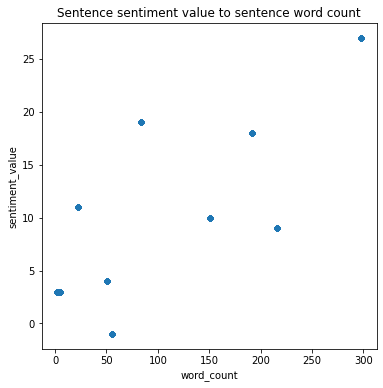

In [44]:
# Correlation analysis
sentiment.plot.scatter(x='word_count',y='sentiment_value',figsize=(6,6),title='Sentence sentiment value to sentence word count')

<AxesSubplot:xlabel='sentiment_value', ylabel='Density'>

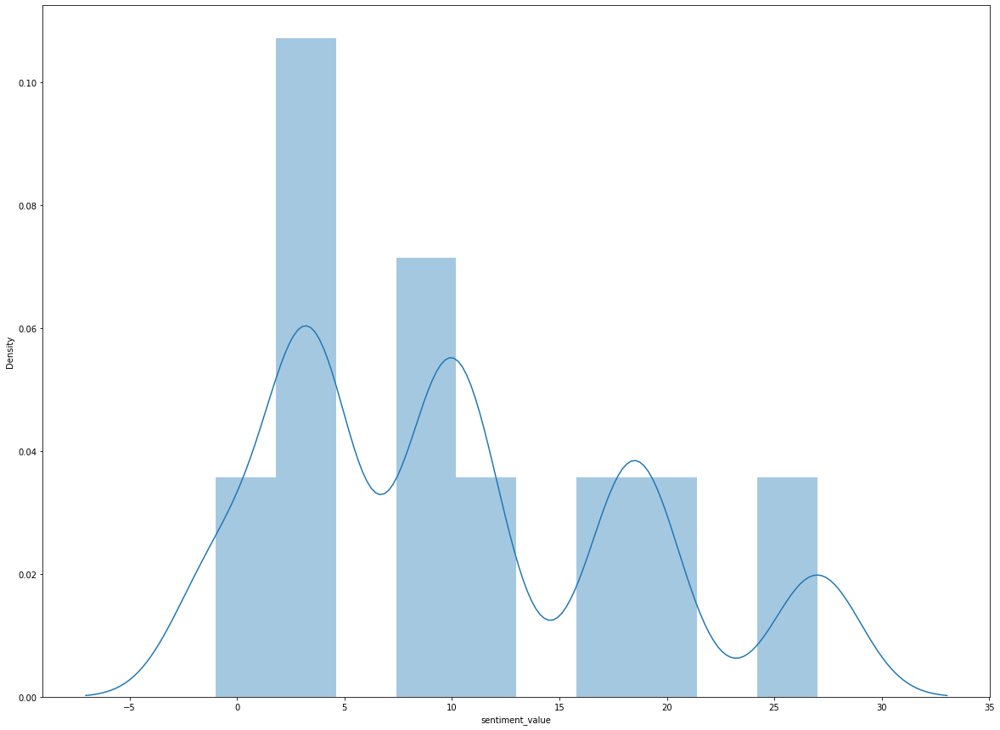

In [45]:
# Plotting the sentiment value for whole review
import seaborn as sns
plt.figure(figsize=(20,15))
sns.distplot(sentiment['sentiment_value'])

<AxesSubplot:xlabel='index', ylabel='sentiment_value'>

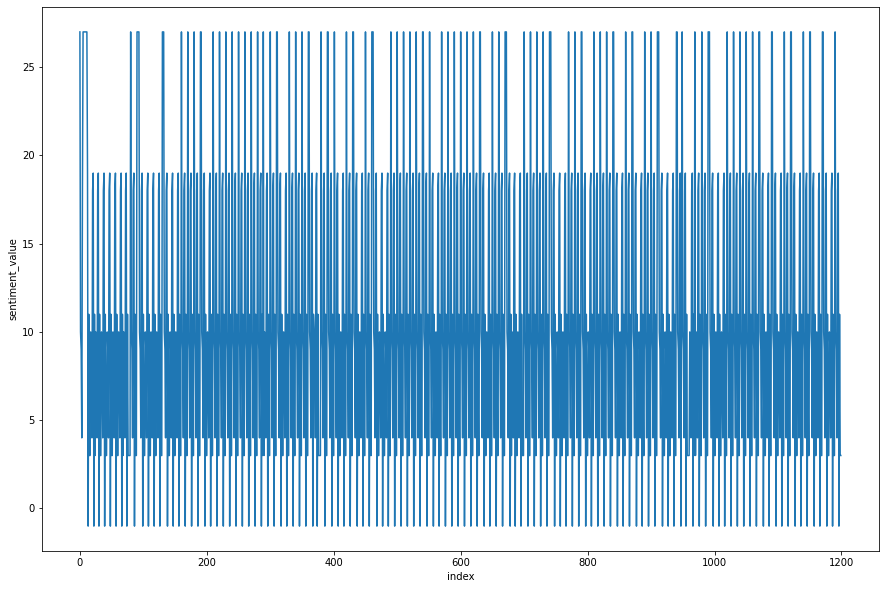

In [46]:
plt.figure(figsize=(15, 10))
sns.lineplot(y='sentiment_value',x='index',data=sentiment)